In [7]:
from pathlib import Path
import os

from astropy.nddata import CCDData
from astropy.visualization import hist
from astropy.stats import mad_std

import ccdproc as ccdp
import matplotlib.pyplot as plt
import numpy as np
import sys
from astropy import units as u


sys.path.append("/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline")
import fpnfix
from aperturePhot import showimage as show_image

In [8]:
path = "/home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/"
day = "20211018"
path_day = os.path.join(path, day)

data_red = Path(path_day, "Reduced_Images")
data_red.mkdir(exist_ok = True)

In [9]:
files = ccdp.ImageFileCollection(path_day)
files.summary['file', 'imagetyp', 'filter', 'exptime', 'naxis1', 'naxis2']

file,imagetyp,filter,exptime,naxis1,naxis2
str30,str11,object,float64,int64,int64
Asteroid1-001R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid1_img2-001R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid2-001V.fit,Light Frame,Bessel V,60.0,1024,1024
Asteroid2_img2-001V.fit,Light Frame,Bessel V,60.0,1024,1024
Asteroid3-001V.fit,Light Frame,Bessel V,60.0,1024,1024
Asteroid3_img2-001V.fit,Light Frame,Bessel V,60.0,1024,1024
BIAS-001.fit,Bias Frame,--,0.0,1024,1024
BIAS-002.fit,Bias Frame,--,0.0,1024,1024
BIAS-003.fit,Bias Frame,--,0.0,1024,1024


In [10]:
calibrated_biases = files.files_filtered(imagetyp='Bias Frame', include_path=True)

combined_bias = ccdp.combine(calibrated_biases,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std, unit = "adu")

combined_bias.meta['combined'] = True

combined_bias.write(os.path.join(data_red / 'combined_bias.fit'), overwrite = True)

In [11]:
calibrated_darks = files.files_filtered(imagetyp='Dark Frame', include_path=True)
reduced_darks= []
exptime= []

for frame in calibrated_darks:
    image = ccdp.CCDData.read(frame, unit = 'adu')
    exptime.append(image.header["exposure"])
    reduced_darks.append(ccdp.subtract_bias(image, combined_bias))
    
combined_darks = ccdp.combine(reduced_darks,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std, unit = "adu", scale =1 / np.array(exptime))

combined_darks.header["exposure"] = 1
combined_darks.header['exptime'] = 1

combined_darks.meta['combined'] = True

combined_darks.write(os.path.join(data_red / 'combined_darks.fit'), overwrite = True)

9.366592247329452 10.322351654725669
-23.61880534105889 63.802978401214055


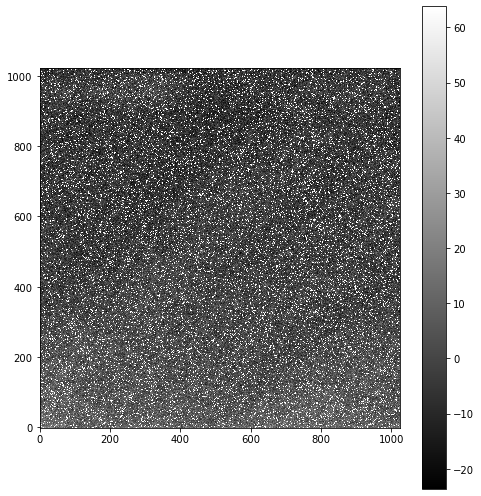

In [12]:
import fpnfix
import ccdproc
import aperturePhot as ap


os.chdir(path_day)
combfpn = fpnfix.buildFPNFrame(files, redpath = "./Reduced_Images", darkim = "combined_darks.fit") #Note this assumes that the SO Darks were taken as 'Light Frame' 
                                       #with OBJECT='SODark' - use imagetyp and object keyword arguments 
                                       #to change this if needed
                                       
#Show the combined FPN frame build from 60 second SO Darks               
ap.showimage(combfpn[60])

In [13]:
flat_imagetyp = 'Flat Field'

flat_filters = set(h['filter'] for h in files.headers(imagetyp=flat_imagetyp))
flat_filters

{'Bessel B', 'Bessel R', 'Bessel V'}

Before image 
8067.2789283196125 71.96787500000045
7782.458333333333 8325.083333333334


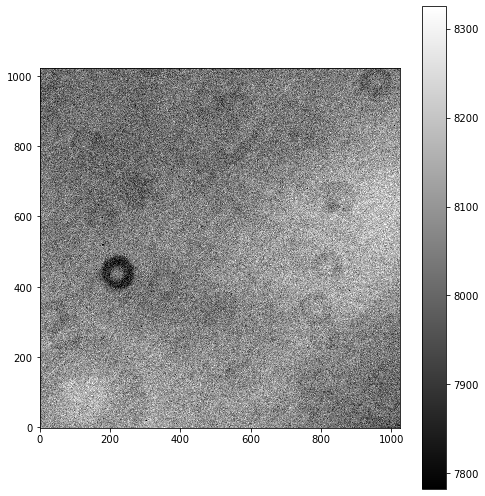

intercept, slope = -0.07642822274461919 0.006432172244364835


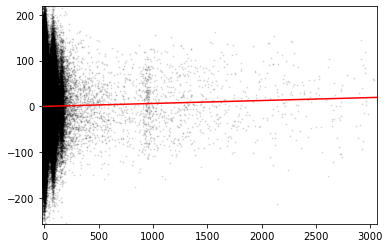

Corrected image
8067.2186807849375 71.94287654454965
7782.486769999927 8324.980723873949


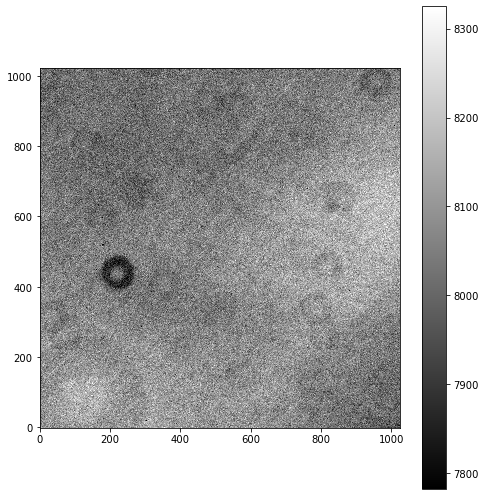

Before image 
8095.815472165743 72.462075
7827.458333333333 8342.708333333334


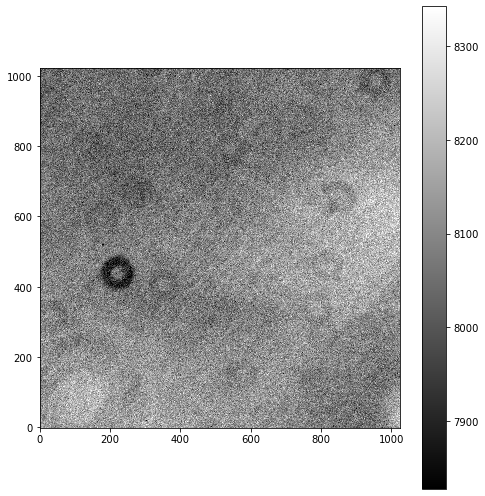

intercept, slope = -0.1339115976002027 0.003010674094718241


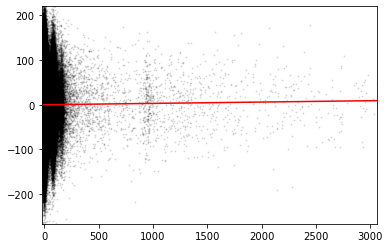

Corrected image
8095.787272409111 72.44783012210624
7827.471643538999 8342.744894609723


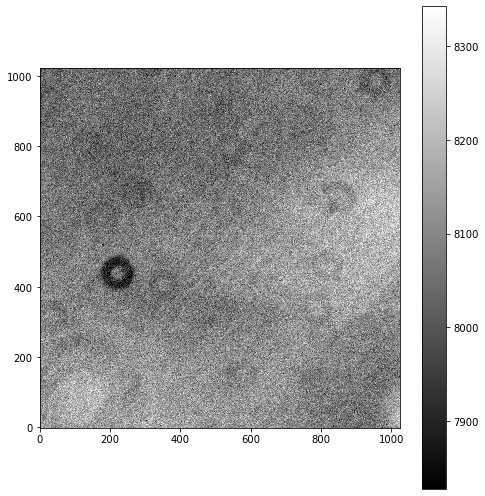

Before image 
8110.231434384981 71.4736750000009
7858.458333333333 8326.791666666666


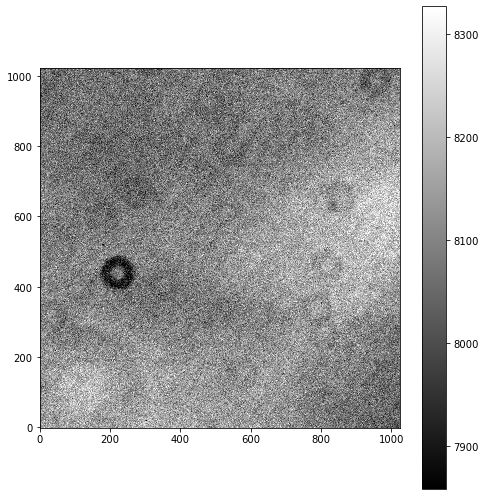

intercept, slope = -0.03722131938049887 -0.0017544042995219838


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.0017544
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


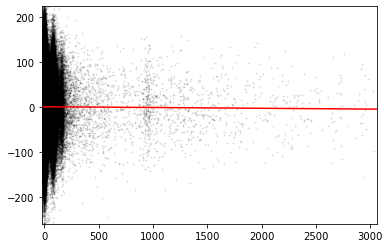

Corrected image
8110.247867174692 71.47884103117937
7858.450577102896 8326.797941101262


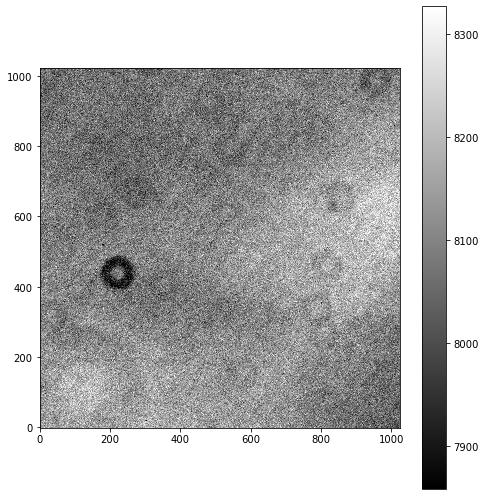

Before image 
8104.785382787386 73.32692499999955
7872.416666666667 8357.083333333334


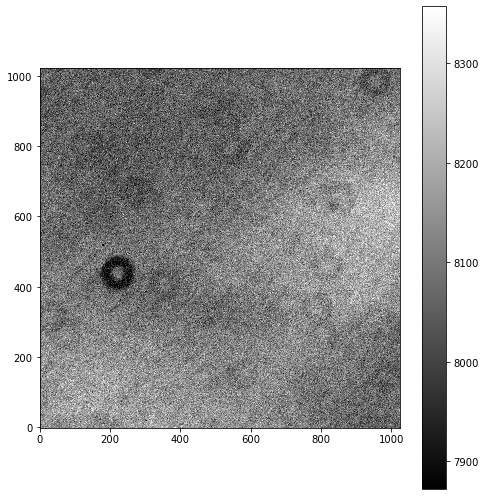

intercept, slope = -0.06916631665666952 -0.003843046627793305


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00384305
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


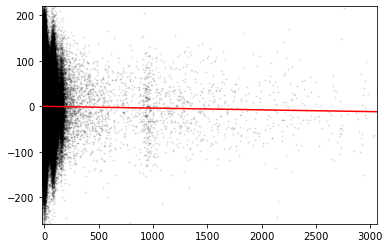

Corrected image
8104.821379038135 73.32531202143765
7872.392774973259 8357.266833682823


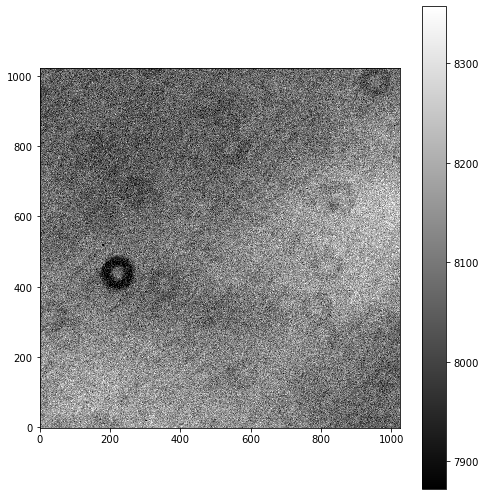

Before image 
8082.153464833895 71.78254999999909
7837.25 8331.791666666666


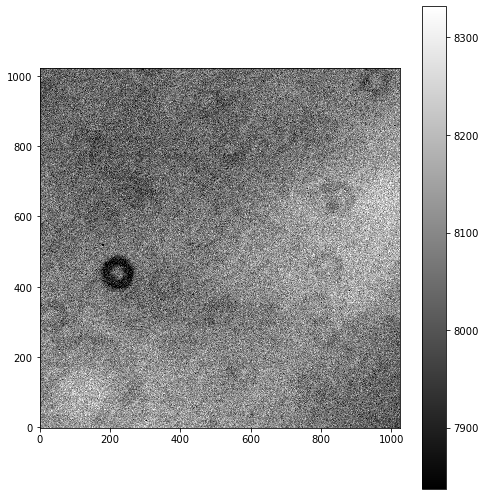

intercept, slope = -0.011829420068827671 -0.004657067201190951


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00465707
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


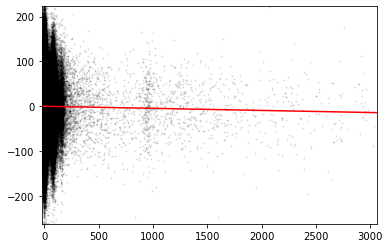

Corrected image
8082.197085683437 71.77817674487048
7837.222170733989 8331.808322156834


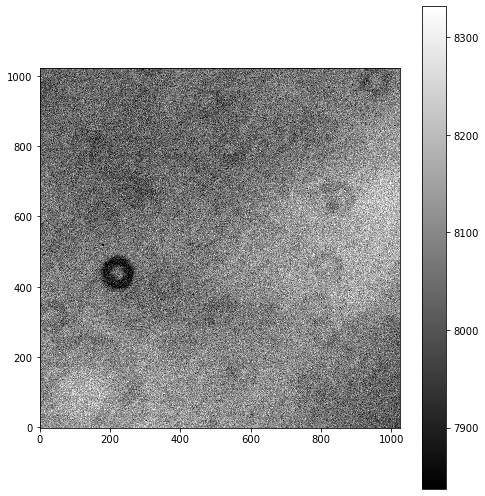

Before image 
11938.597522747516 130.87651500000214
11529.275 12621.6875


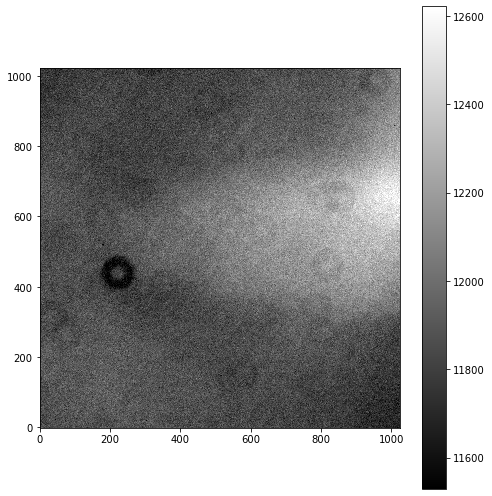

intercept, slope = 0.07422067002312477 -0.001363922629935439


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00136392
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


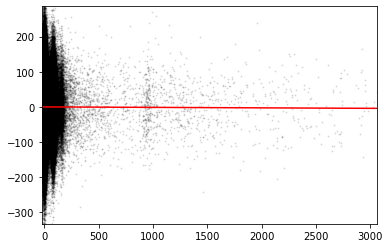

Corrected image
11938.610298054642 130.87265437517664
11529.266628047066 12621.692377919722


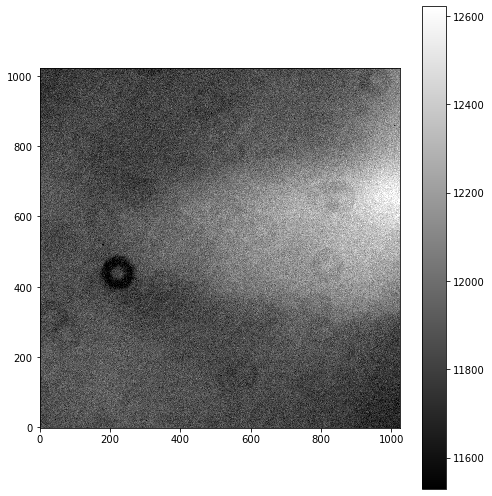

Before image 
11962.926122677325 126.92909249999892
11598.35 12545.775


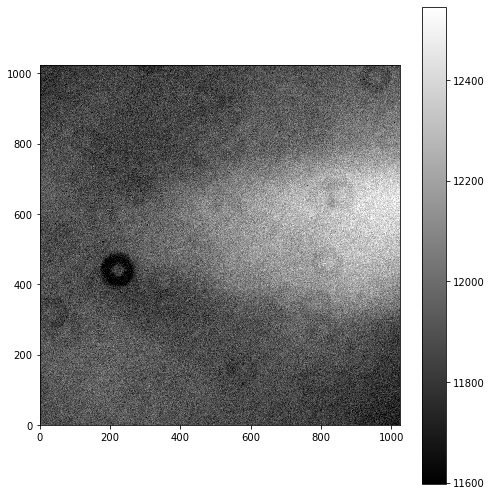

intercept, slope = 0.09687560215914835 -0.0038555977776486027


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.0038556
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


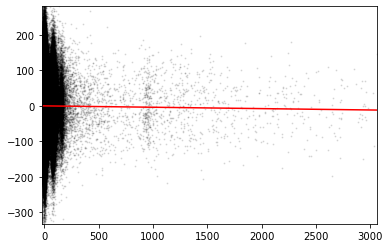

Corrected image
11962.962236489579 126.90602135096081
11598.295489793383 12545.763325165279


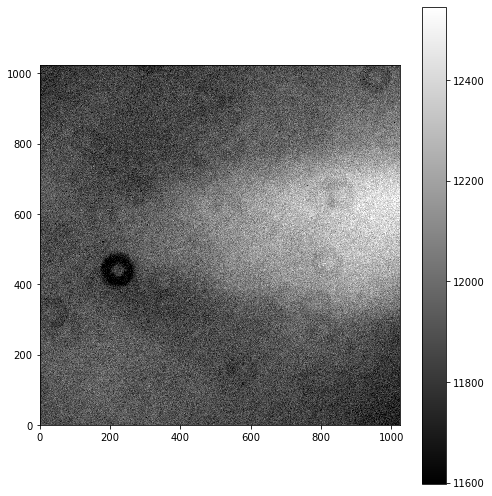

Before image 
11966.09444810152 125.61328500000053
11493.5875 12549.6875


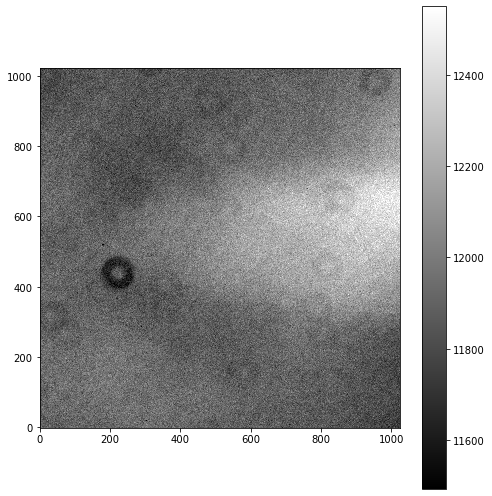

intercept, slope = -0.07064254537358439 -0.0071554656121437295


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00715547
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


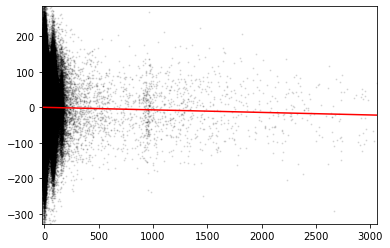

Corrected image
11966.161470430256 125.6168622545056
11493.555865649705 12549.713090738118


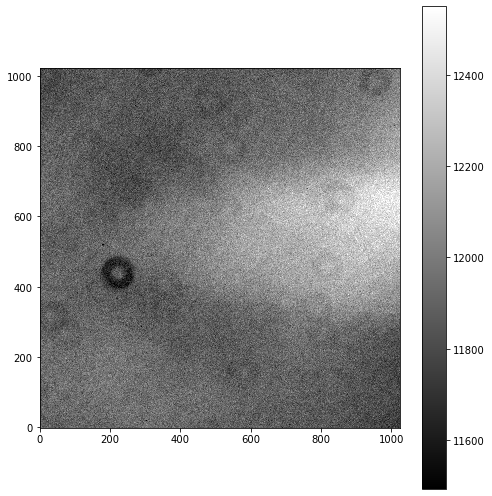

Before image 
11968.06069947481 125.76154500000108
11578.575 12491.6875


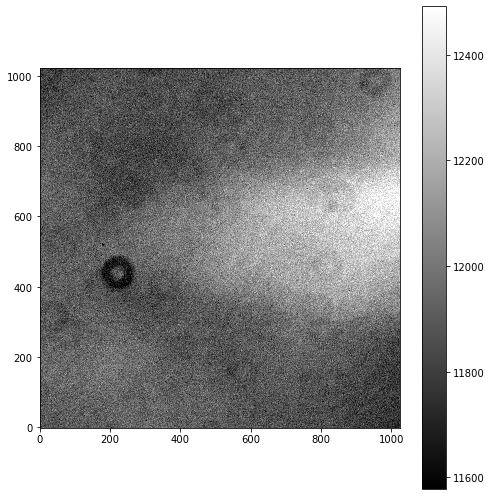

intercept, slope = 0.10541614571540833 -0.005788742076695584


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00578874
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


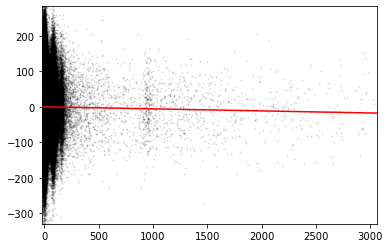

Corrected image
11968.11492026147 125.78349439642874
11578.646247165865 12491.708202801265


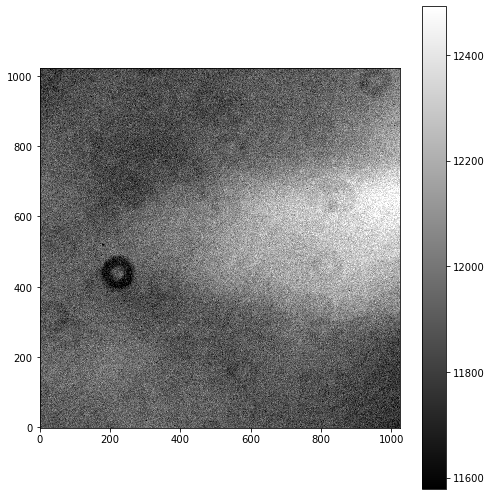

Before image 
11967.392936718463 127.89278250000108
11494.5875 12691.43705961355


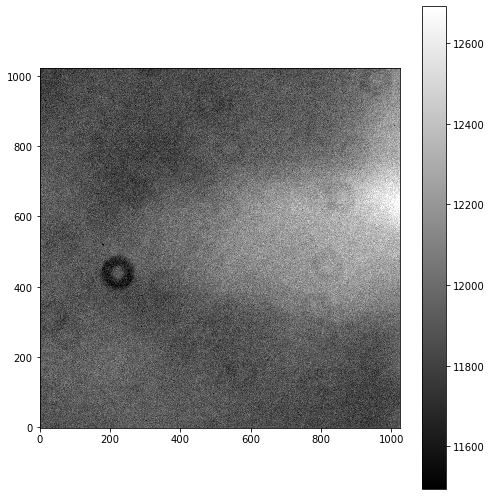

intercept, slope = -0.04581073315714786 -0.004364012165522002


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00436401
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


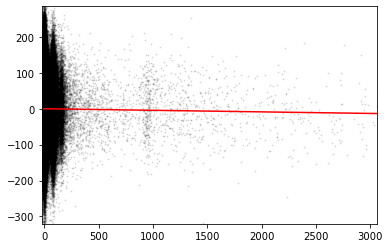

Corrected image
11967.43381264098 127.89575927713115
11494.568206679758 12691.452259571059


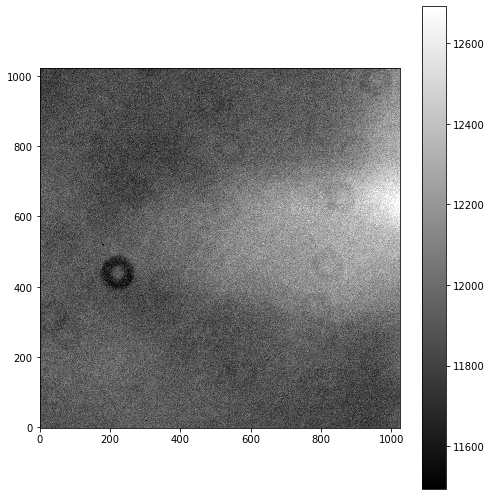

Before image 
13304.680050849915 103.782
12947.0 13583.5


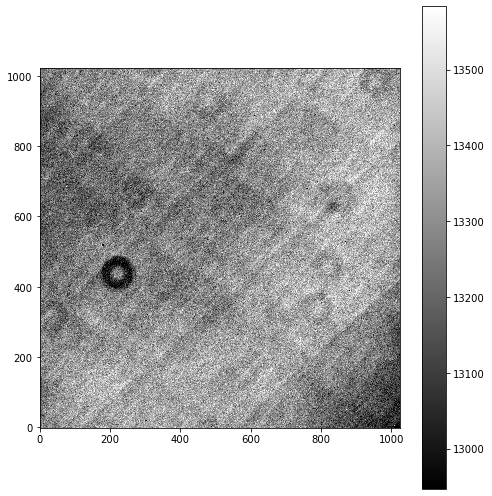

intercept, slope = -0.812158758160549 0.058524962362183165


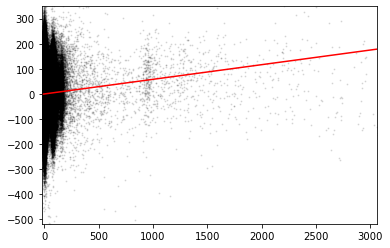

Corrected image
13304.131871391179 103.74622464833962
12945.916615385573 13583.40828308568


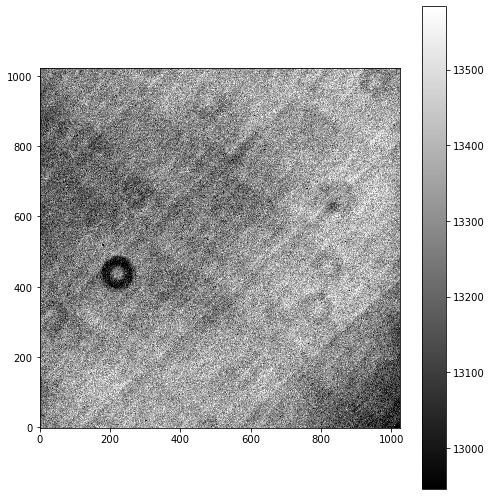

Before image 
13529.094754219055 103.782
13131.0 13892.0


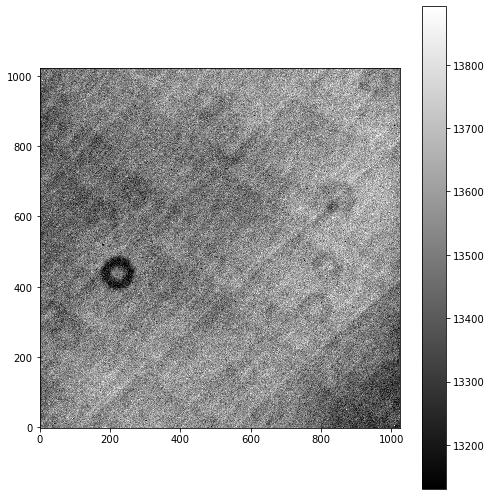

intercept, slope = -0.6468390405497255 0.04794407788254679


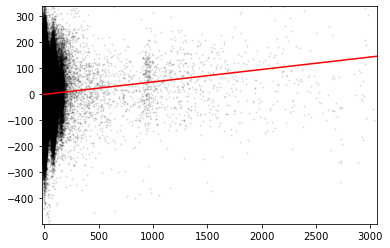

Corrected image
13528.645681590859 103.42942142247999
13131.211961015051 13892.15873586413


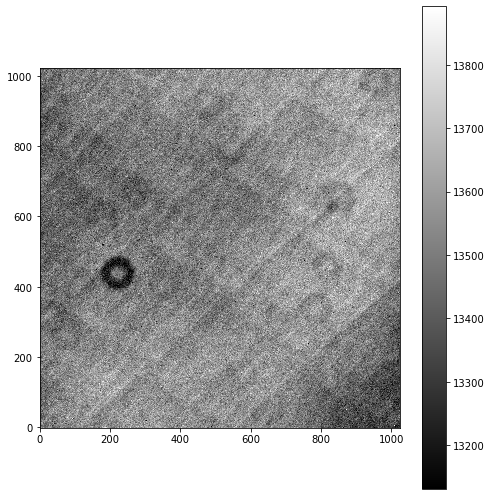

Before image 
13571.606021881104 103.782
13159.0 13873.0


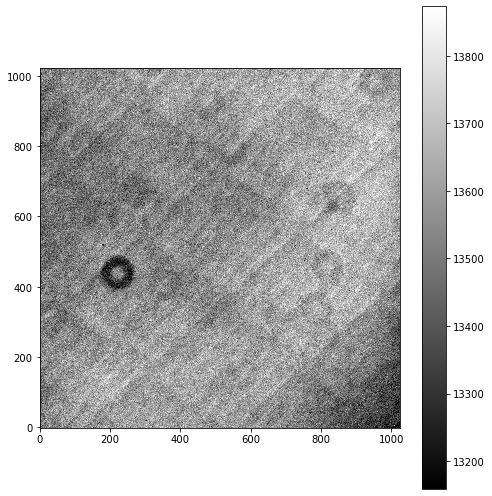

intercept, slope = -0.3459750003692558 0.014775842826538668


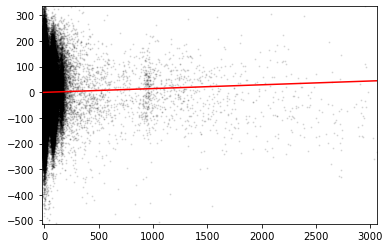

Corrected image
13571.467622586228 103.8068479108076
13158.726477042661 13871.668726922895


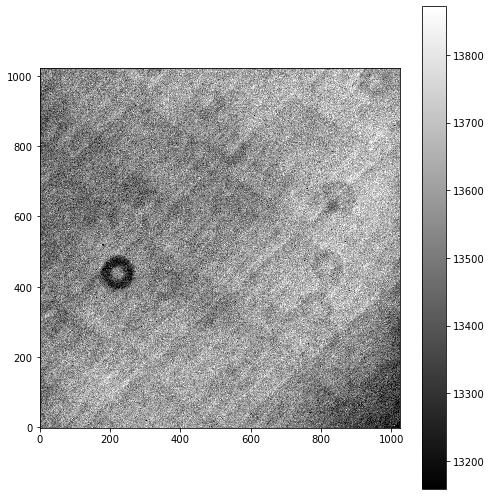

Before image 
13574.615063667297 103.782
13093.0 13935.0


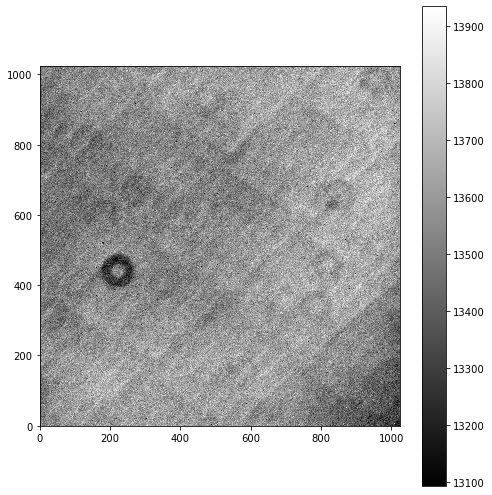

intercept, slope = 0.005305765703371484 -0.015575900608335162


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.0155759
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


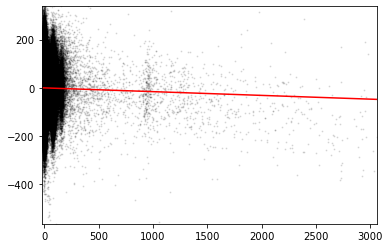

Corrected image
13574.760956777181 103.95704217484277
13092.931138863254 13935.055705500527


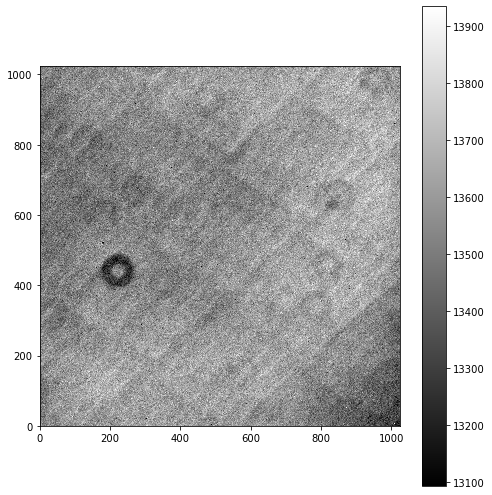

Before image 
13516.076251983643 103.782
13021.0 13810.0


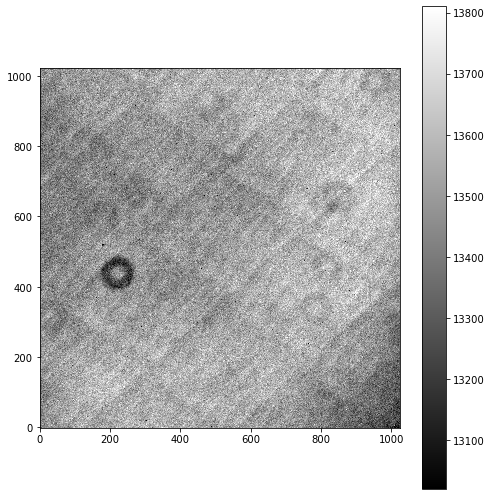

intercept, slope = 0.1133979531947502 -0.02732188294873773


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.0273219
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


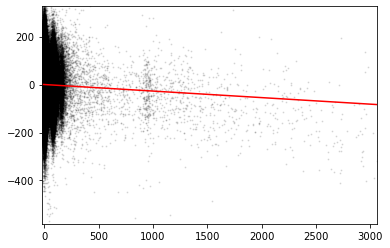

Corrected image
13516.33216492066 103.54846214141529
13021.50576893054 13809.66295094161


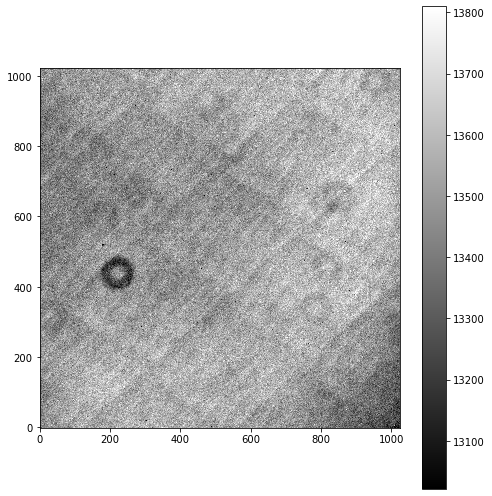

In [14]:
scale = lambda a: 1/np.median(a)

master_flats = {}

for filt in flat_filters:
    reduced_flats = []
    calibrated_flats = files.files_filtered(imagetyp = flat_imagetyp, filter = filt, include_path=True)
    
    for flat in calibrated_flats:
        image = ccdp.CCDData.read(flat, unit = "adu")
        image = ccdp.subtract_bias(image, combined_bias)
        image = ccdp.subtract_dark(image, combined_darks, scale=True, exposure_unit=u.s, exposure_time = "exptime")
        image = fpnfix.subtract_fpn(image,combfpn[60],mesh_size=32, verbose = 2)
        reduced_flats.append(image)
    
    combined_flats = ccdp.combine(reduced_flats,
                                 method='median',
                                 sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                                 sigma_clip_func=np.ma.median, signma_clip_dev_func=mad_std, unit = "adu", scale = scale
                                )

    master_flats[filt]=combined_flats.copy()

    combined_flats.write(data_red / (filt.replace("","_")+"_combined_flats.fit"), overwrite = True)

804.1764883995056 2.2239
797.5 815.3232817412738


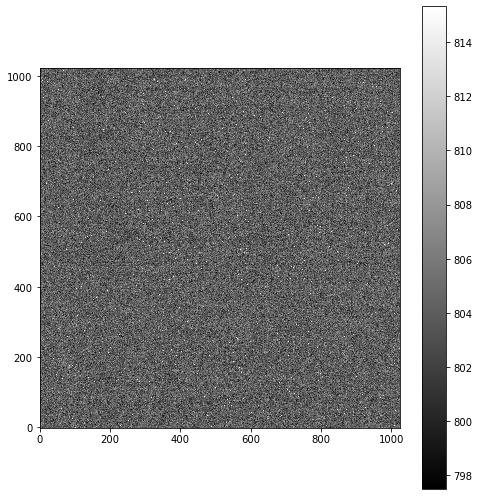

In [15]:
show_image(combined_bias)

0.7726716915766397 0.14825999999999995
0.275 1.4686727950129455


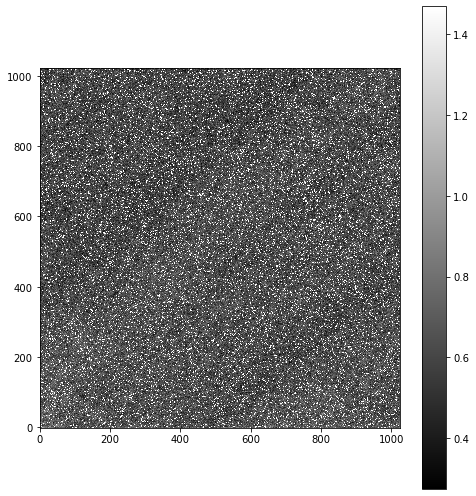

In [16]:
show_image(combined_darks)

1.0001142128159564 0.007115947603569167
0.9690924435129342 1.026848344238767


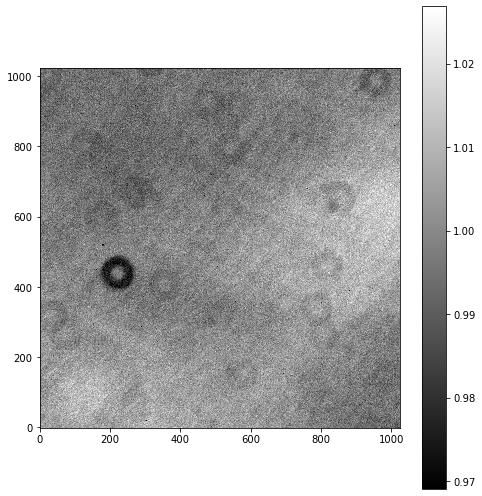

1.0029116733560866 0.008869586061361713
0.9697540102582093 1.0515887006099982


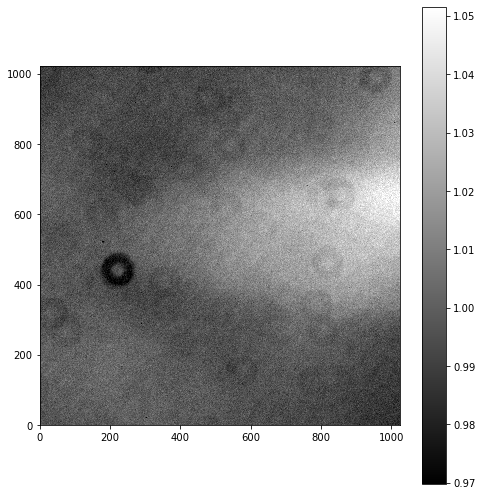

0.9997332871590731 0.0064706263154370135
0.9703938580376402 1.0166878116932951


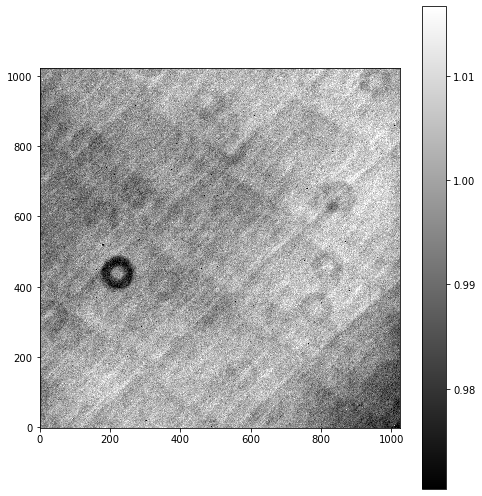

In [17]:
for filt,image in master_flats.items():
    show_image(image)

In [18]:
images = files.files_filtered(imagetyp="Light Frame", include_path = True)

for image in images:
    var = ccdp.CCDData.read(image, unit = "adu")
    var_filt = var.header["filter"]
    
    corr_filt = master_flats[var_filt]
    
    var = ccdproc.ccd_process(var,
                             master_bias = combined_bias, dark_frame = combined_darks,
                             master_flat = corr_filt, exposure_key="exposure", exposure_unit = u.second,
                             dark_scale = True)
    proc_data = os.path.basename(image)
    var.write(data_red / ("BDF_"+proc_data), overwrite = True)

In [31]:
data = "/home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211018/Reduced_Images/BDF_Ross_154-001V.fit"
V = os.path.join(path, data)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
56.526328405183136 9.890459699769933
22.868999987024463 115.01570412638665


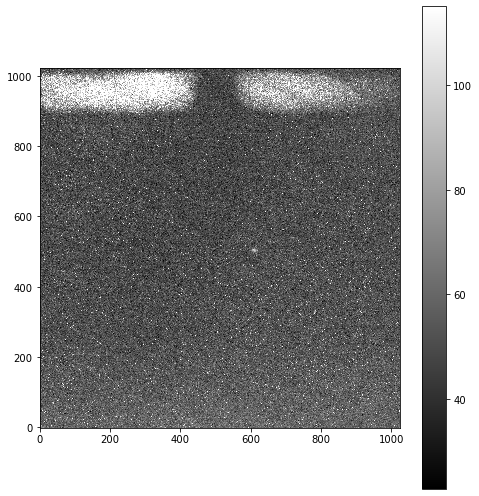

In [32]:
Vimage = ccdp.CCDData.read(V, unit="adu")
show_image(Vimage)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
47.352190384609955 11.553104811186037
3.9828876041652004 112.14396327773467


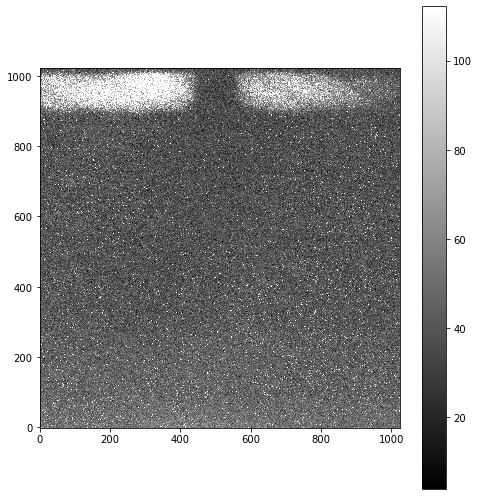

In [34]:
data = "/home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211018/Reduced_Images/BDF_Ross_154-001B.fit"
B = os.path.join(path, data)
Bimage = ccdp.CCDData.read(B, unit="adu")
show_image(Bimage)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
67.84083150020636 10.653882513450638
35.219260279520725 128.75175549851974


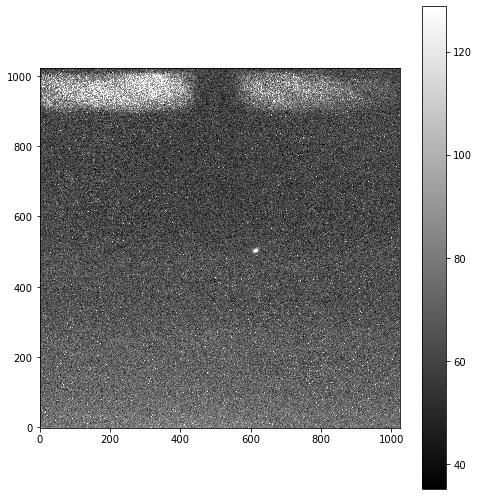

In [36]:
data = "/home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211018/Reduced_Images/BDF_Ross_154-001R.fit"
R = os.path.join(path, data)
Rimage = ccdp.CCDData.read(R, unit="adu")
show_image(Rimage)

In [ ]:
import plateSolve

check = plateSolve.autoSolve(R,Rimage)
print("Check should be true if autoSolve worked correctly.")
print(V,check)
print(check)

In [ ]:
plateSolve.manualSolvePlot(V,Vimage)

In [ ]:
gaia_list = [0,1, 3, 9, 12,17,22,24,54]
image_list = [0,1,4,5,8, 11, 13, 15,16]

check = plateSolve.manualSolve(V,Vimage,gaia_list,image_list)
print("Check is True if successful")
print(V,check)